In [1]:
import numpy as np                  # handles arrays and matrices operations
import os                           # directories and data
import matplotlib.pyplot as plot    # plotting curve
from PIL import Image               # import images
import cv2                          # openCV, image display and overlap
from sklearn.cluster import KMeans  # apply K-means
import random                       # random selections
from skimage import io              # image display

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Conv2D, MaxPooling2D, Dense, Dropout, LeakyReLU, UpSampling2D, concatenate, ReLU
from tensorflow.keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint

In [2]:
import os
os.chdir('drive/My Drive/Projects/Cityscape Semantic Segmentation')

In [3]:
# from google.colab.patches import cv2_imshow

# load images from directory
def LoadImage(name, path="cityscapes_data/cityscapes_data/train"):

    img = Image.open(path + "/" + name)
    img = np.array(img)
    
    # extracting segmented part
    seg = img[:, 256:]
    # extracting image part
    img = img[:, 0:256]

    # removing car bonut in image
    seg = seg[:192, :]
    img = img[:192, :]
    
    img = np.array(img)
    seg = np.array(seg)
    return img/255, seg/255

## CLASSIFYING COLOR SPACE using CLUSTERING

Dataset has image with corresponding segmented mask

*   Object classes - Need to derive from pixel color
*   However pixel values for even same object are different 
*   This is possibly due to change in pixel values image compression and conversion to current jpg form

Assigning classes
1.   Manually assigning color centers and mapping pixel to nearest center - tedious and not consistent with pixel groups
2.   Use k-Means clustering for grouping image pixel into classes



# KMeans Clustering

*   Randomly select 400 images from training set 
*   Add points in 3D space (correponding to pixel - GBR format with value 0.0 to 1.0)

*   Perform clustering, K = 14.
*   On observing segmented masks - saw 14-15 colors to represent different objects and map pixels to classes


> Blue - Locomotive (car/bike)

> Red - People

> Pink - Pavement

> Yellow - Light/Sign board

> Green - Trees/bushes

> Light green - Grass

> Greenish blue - Bus/train

> Violet - Road

> Black - Car bonnet / traffic sign / pole

> Gray - Buildings

> Sky blue - Sky

> Purple - Sodewalk

> Peach - Parking area

> Brown - shops



















In [4]:
# Classify pixel colors into distinct classes and apply segmentation

from random import sample

train_size = 2975

# randomly selecting 300Gaussian Mixture Model images from training set to apply clustering (all pixels from these images) and select 14 color classes
sequence = [i for i in range(train_size)]
#select 300 random training images
subset = sample(sequence, 300)

files = os.listdir("cityscapes_data/cityscapes_data/train")

colors = []
for i in subset:
    img, seg = LoadImage(files[i])
    # print("%d " %(i))
    colors.append(seg.reshape(seg.shape[0]*seg.shape[1], 3))

colors = np.array(colors)
# colors contains all pixels represented as points in 3D plane - coordinates are GBR(0 to 1 each)
colors = colors.reshape((colors.shape[0]*colors.shape[1],3))

#Run K-means clustering
km = KMeans(14).fit(colors)

In [5]:
colorSet = set()
# Creating set which contains pixel values for all the chosen images for color_class_determination
for i in subset:
    img, seg = LoadImage(files[i])
    seg = seg.reshape(seg.shape[0]*seg.shape[1], 3)
    # print(seg.shape)
    for i in range(seg.shape[0]):
      # print(seg[i])
      colorSet.add(tuple(seg[i]))


In [6]:
 # give values of color centers obtained in K-means
center_colors = km.cluster_centers_
# for K-means had scaled value down by 255, revert back (factor along each dimension 255, no change with clustering)
center_colors = center_colors * 255
center_colors = center_colors.astype(int)

# display color centeres in RGB color format
print(center_colors)

[[106 139  35]
 [128  62 127]
 [ 70  70  68]
 [236  39 224]
 [  2   1 140]
 [ 77 124 172]
 [197 154 157]
 [  8  10   8]
 [157 245 155]
 [207  24  61]
 [ 89   6  68]
 [214 204  34]
 [121 127  96]
 [  9  21  87]]


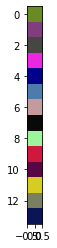

In [7]:
# TO DISPLAY - OBTAINED COLORS AFTER APPLYING K-MEANS CLUSTERING

n = len(center_colors)

x = np.zeros((n,1,3))
for k in range(n): 
  x[k][0][0] = center_colors[k][0]
  x[k][0][1] = center_colors[k][1]
  x[k][0][2] = center_colors[k][2]

plot.imshow(x / 255)

In [8]:
# have segment (result image mask after segmentation)
# convert it into categorical format

def ColorsToClass(seg):
    s = seg.reshape((seg.shape[0]*seg.shape[1],3))
    s = km.predict(s)
    s = s.reshape((seg.shape[0], seg.shape[1]))
    
    # number of color centers
    n = len(center_colors)
    
    cls = np.zeros((seg.shape[0], seg.shape[1], n))
    
    for i in range(n):
        m = np.copy(s)
        m[m!=i] = -1   #all not class i - mark -1
        m[m!=-1] = 1   #left (class i) - mark 1
        m[m==-1] = 0   #mark again to 0 (non class i)
        
        # marking for class i for segment's pixels
        cls[:,:,i] = m
        
    return cls


In [9]:
# Build image showing classified pixels - to visualize resultant after preprocessing
def LayersToRGBImage(img):
    
    nimg = np.zeros((img.shape[0], img.shape[1], 3))  # length, breadth and RGB
    
    # img.shape[2] - No of classes
    
    for i in range(img.shape[2]):
        c = img[:,:,i]               # image array, class i? 1: Yes, 0:No (those pixels in class i - have 1 marked against them)
        # col = colors[i]
        col = center_colors[i]       # corresponding RGB color for class i
        
        for j in range(3):            # each in RGB
            nimg[:,:,j] += col[j]*c   # add class i's color value for corresponding pixels (having c[length_pos][width_pos] = 1)

    nimg = nimg/255.0
    return nimg

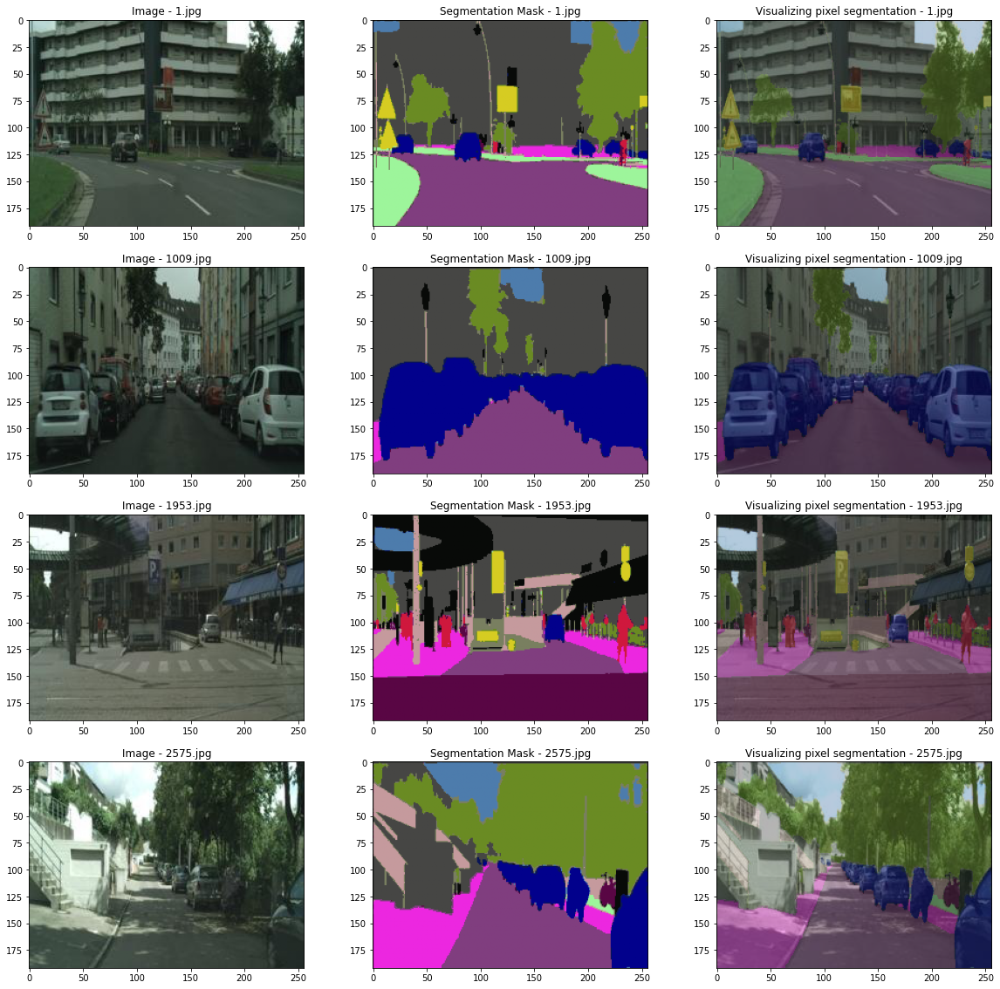

In [10]:
# Test image after preprocessing
def show_image(name):
  img, seg = LoadImage(name)
  seg2 = ColorsToClass(seg)
  seg2 = LayersToRGBImage(seg2)
  total = cv2.addWeighted(img, .6, seg2, 0.4, 0)
  
  return img, seg2, total


plot.figure(figsize = (20,20))
names = ["1.jpg", "1009.jpg", "1953.jpg", "2575.jpg"]
for i in range(len(names)):

  img, seg, total = show_image(names[i])
  
  plot.subplot(len(names), 3, i*3 + 1)
  plot.title("Image - "  + names[i])
  plot.imshow(img)

  plot.subplot(len(names), 3, i*3 + 2)
  plot.title("Segmentation Mask - " + names[i])
  plot.imshow(seg)

  plot.subplot(len(names), 3, i*3 + 3)
  plot.title("Visualizing pixel segmentation - " + names[i])
  plot.imshow(total)
plot.show()

In [11]:
# generate images, segments for training and validating data
def Generate(path="cityscapes_data/cityscapes_data/train", batch_size = 16):
    
    # images in training set
    files = os.listdir(path)
    while True:

    # generators which add image when iterated over file (train images)
      imgs=[]
      segs=[]
      
      # iterables
      for i in range(batch_size):
          file = random.sample(files,1)[0]
          
          # flip=False
          # if random.random() > 0.5:
          #     flip=True
          
          # angle = maxangle*(random.random()*2-1)
          
          img, seg = LoadImage(file, path)
          
          seg = ColorsToClass(seg)
          
          imgs.append(img)
          segs.append(seg)
      # return generator    
      yield np.array(imgs), np.array(segs)


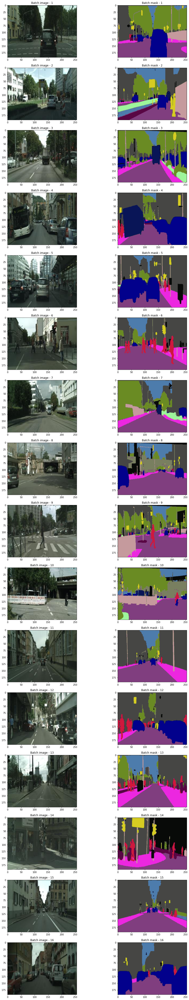

In [12]:
# generator function (default generate batch for TRAINING SET)
gen = Generate()
# generate a next random batch (after one previously generated)
imgs, segs = next(gen)

# print(imgs.shape)

n = len(imgs)

plot.figure(figsize = (16, 80))   # column by row space demarcated
for i in range(n):
  plot.subplot(n, 2, i*2 + 1)
  plot.title("Batch image - %d" %(i+1))
  plot.imshow(imgs[i])

  plot.subplot(n, 2, i*2 + 2)
  plot.title("Batch mask - %d" %(i+1))
  plot.imshow(LayersToRGBImage(segs[i]))
plot.show()

In [13]:
# BUILDING U-Net components

# encoder block (for downsampling using ConvBlocks and pooling)
def encoder(inp, channels, kernel_size, batch_norm = True, dropout = 0.5):
  x = Conv2D(channels, kernel_size, padding = "same")(inp)
  x = BatchNormalization()(x) if batch_norm else x
  x = ReLU()(x) 

  x = Dropout(dropout)(x) if dropout > 0. else x
  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = ReLU()(x) 
  
  p = MaxPooling2D()(x)                           # Maxpooling - halving block size (channels same)

  return p, x 

# decoder block (for upsampling using Transpose convolution blocks)
def decoder(inp, channels, kernel_size, skip_conv, batch_norm = True, dropout = 0.5):
  x = UpSampling2D()(inp)                         # Upsample (inverse mapping of MaxPooling)
  x = concatenate([x, skip_conv])

  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = BatchNormalization()(x) if batch_norm else x
  x = ReLU()(x)
  
  x = Dropout(dropout)(x) if dropout > 0. else x
  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = ReLU()(x) 
  
  return x

# bottle neck (bottom most component - WHEN channels highest and object dimension lowest)
def bottle_neck(inp, channels, kernel_size, batch_norm = True, dropout = 0.5):
  x = Conv2D(channels, kernel_size, padding = "same")(inp)
  x = ReLU()(x) 
  x = BatchNormalization()(x) if batch_norm else x
  
  x = Dropout(dropout)(x) if dropout > 0. else x
  x = Conv2D(channels, kernel_size, padding = "same")(x)
  x = ReLU()(x) 
  
  return x

In [14]:
# BUILDING MODEL using above blocks
x = Input(shape=(192, 256, 3))  # length X Width X colors(channels)

# down-sampling 
p1, x1 = encoder(x, 64, 3)
p2, x2 = encoder(p1, 128, 3)
p3, x3 = encoder(p2, 256, 3)

# bottleneck
x4 = bottle_neck(p3, 512, 3)

# up-sampling
u5 = decoder(x4, 256, 3, x3)
u6 = decoder(u5, 128, 3, x2)
u7 = decoder(u6, 64, 3, x1)

# softmax layer
x8 = Conv2D(len(center_colors), 1, activation="softmax")(u7)


model = Model(x, x8)

opt = Adam(lr=0.0005)
model.compile(optimizer=opt,
             loss="categorical_crossentropy",
             metrics=["accuracy"])

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 192, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 192, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 192, 256, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 conv2d_11 (Conv2D)             (None, 96, 128, 128  147584      ['dropout_5[0][0]']              
                                )                                                                 
                                                                                                  
 re_lu_11 (ReLU)                (None, 96, 128, 128  0           ['conv2d_11[0][0]']              
                                )                                                                 
                                                                                                  
 up_sampling2d_2 (UpSampling2D)  (None, 192, 256, 12  0          ['re_lu_11[0][0]']               
                                8)                                                                
                                                                                                  
 concatenate_2 (Concatenate)    (None, 192, 256, 19  0           ['up_sampling2d_2[0][0]',        
          

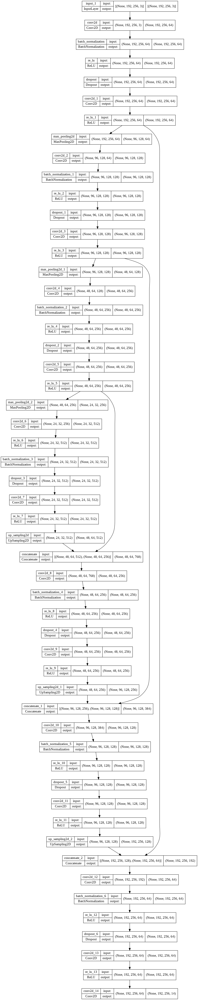

In [15]:
# Vizualizing the U-net model
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [16]:
train_gen = Generate()
val_gen = Generate("cityscapes_data/cityscapes_data/val")

In [19]:
clb = [ModelCheckpoint("best_result.h5", save_best_only=True, verbose=0)]

h = model.fit(train_gen, epochs = 20, steps_per_epoch = 2975/16, validation_steps = 500/16, validation_data=val_gen, callbacks = clb)

Epoch 1/20
185/185 [==============================] - 142s 657ms/step - loss: 1.2984 - accuracy: 0.6223 - val_loss: 3.8079 - val_accuracy: 0.2802
Epoch 2/20
185/185 [==============================] - 121s 648ms/step - loss: 0.9564 - accuracy: 0.7225 - val_loss: 2.0394 - val_accuracy: 0.4579
Epoch 3/20
185/185 [==============================] - 120s 648ms/step - loss: 0.8562 - accuracy: 0.7503 - val_loss: 1.2422 - val_accuracy: 0.6409
Epoch 4/20
185/185 [==============================] - 120s 648ms/step - loss: 0.7845 - accuracy: 0.7719 - val_loss: 0.8259 - val_accuracy: 0.7535
Epoch 5/20
185/185 [==============================] - 119s 641ms/step - loss: 0.7572 - accuracy: 0.7775 - val_loss: 0.9142 - val_accuracy: 0.7517
Epoch 6/20
185/185 [==============================] - 120s 646ms/step - loss: 0.7024 - accuracy: 0.7925 - val_loss: 0.7742 - val_accuracy: 0.7731
Epoch 7/20
185/185 [==============================] - 120s 645ms/step - loss: 0.6865 - accuracy: 0.7964 - val_loss: 0.7523 -

In [20]:
# save model
model.save("model.h5")
# load weights giving best results
model = load_model("best_result.h5")


[3.8079352378845215, 2.039445400238037, 1.2422497272491455, 0.8259274959564209, 0.9141784310340881, 0.7742346525192261, 0.7523475885391235, 0.7389293313026428, 0.7059189081192017, 0.7152597904205322, 0.6979636549949646, 0.7266848683357239, 0.7120532393455505, 0.7067515850067139, 0.695726752281189, 0.6625980734825134, 0.6395312547683716, 0.6696504950523376, 0.6393882632255554, 0.704341471195221]
[0.28018999099731445, 0.457876592874527, 0.6409039497375488, 0.7535438537597656, 0.75166916847229, 0.7731099128723145, 0.7865044474601746, 0.7906822562217712, 0.7908685803413391, 0.789557933807373, 0.7948708534240723, 0.790324866771698, 0.7949240207672119, 0.7873935103416443, 0.8019019961357117, 0.8079468607902527, 0.8119319081306458, 0.8047575950622559, 0.8152265548706055, 0.7904292941093445]


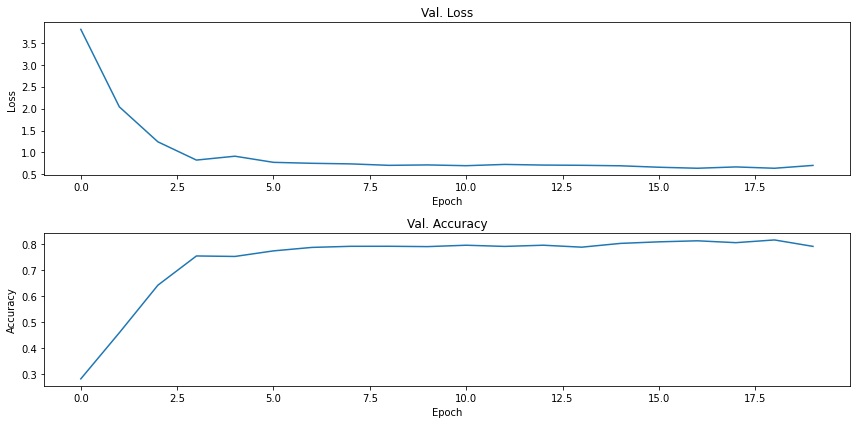

In [21]:
# plot loss and accuracy (validation set)
loss = h.history["val_loss"]
acc = h.history["val_accuracy"]

print(loss)
print(acc)

plot.figure(figsize=(12, 6))
plot.subplot(2, 1, 1)
plot.title("Val. Loss")
plot.plot(loss)
plot.xlabel("Epoch")
plot.ylabel("Loss")

plot.subplot(2, 1, 2)
plot.title("Val. Accuracy")
plot.plot(acc)
plot.xlabel("Epoch")
plot.ylabel("Accuracy")

plot.tight_layout()
plot.savefig("learn.png", dpi=150)
plot.show()

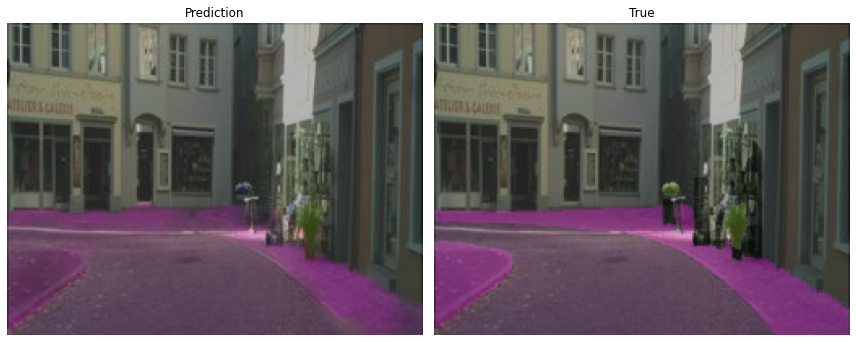

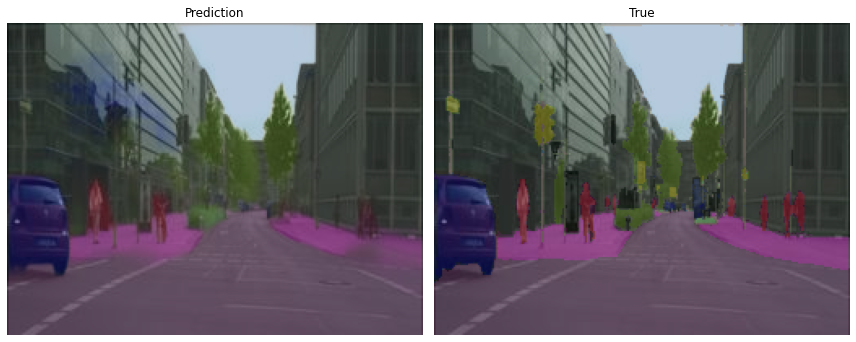

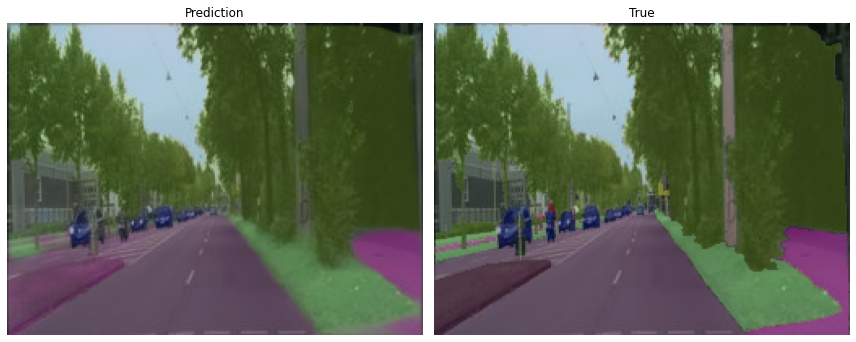

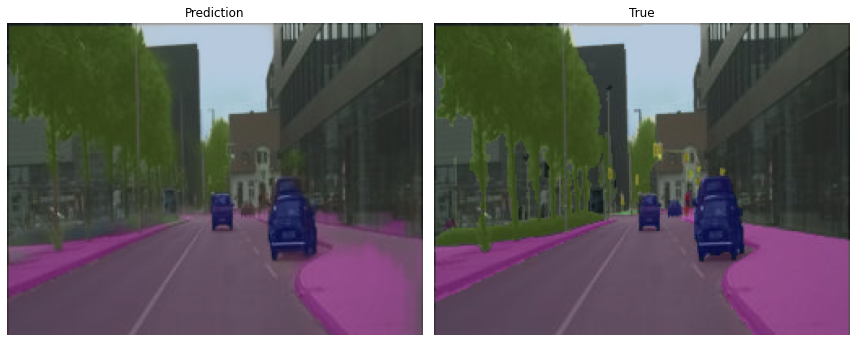

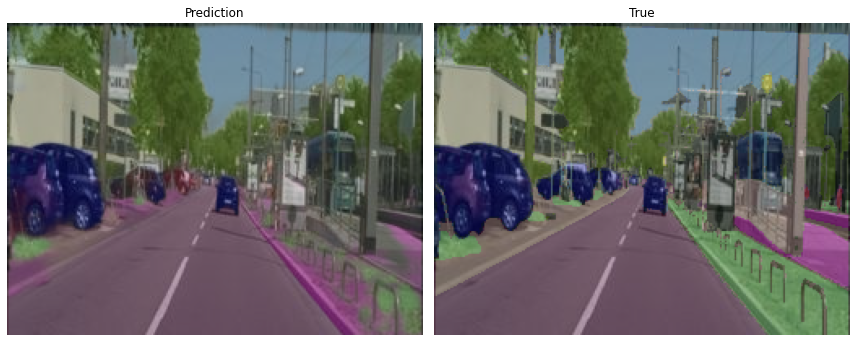

...

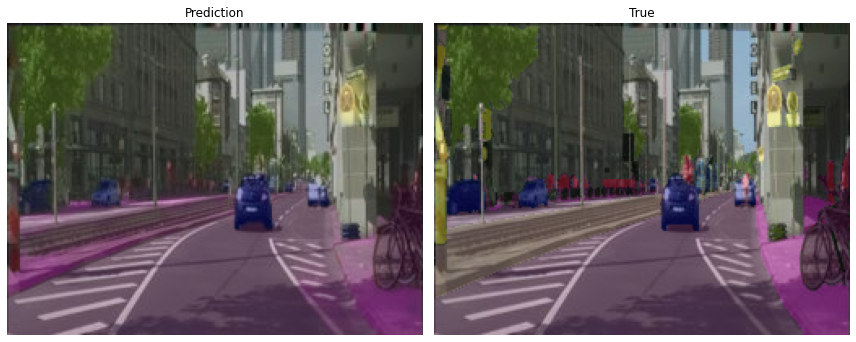

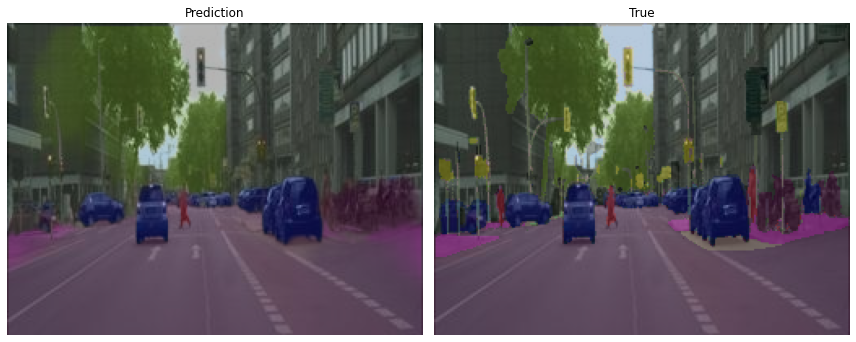

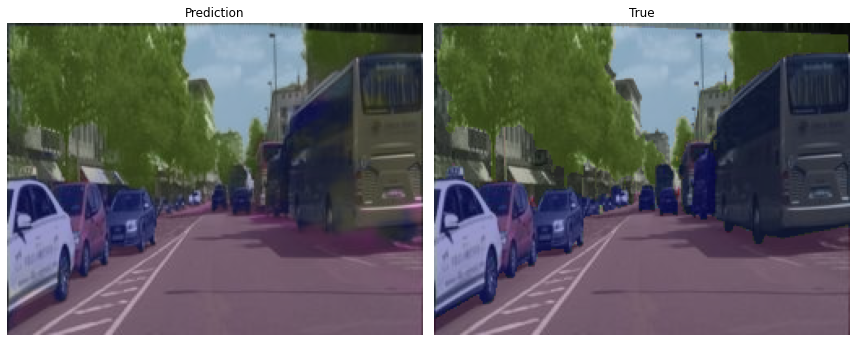

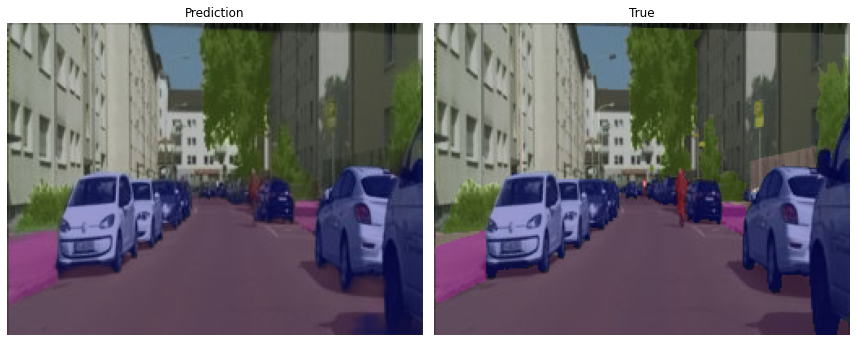

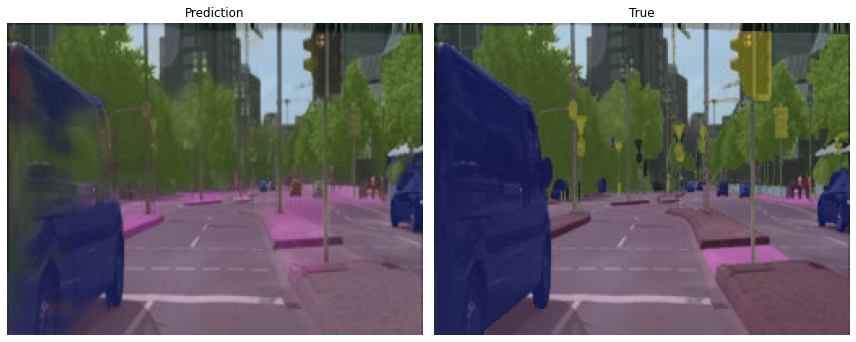

In [22]:
# generate test case to check prediction
test_gen = Generate("cityscapes_data/cityscapes_data/val")
max_show = 20
for imgs, segs in test_gen:
    p = model.predict(imgs)   #model prediction
    for i in range(p.shape[0]):
        if i > max_show:
            break
        _p = LayersToRGBImage(p[i])
        _s = LayersToRGBImage(segs[i])
        
        predimg = cv2.addWeighted(imgs[i], 0.6, _p, 0.4, 0)
        trueimg = cv2.addWeighted(imgs[i], 0.6, _s, 0.4, 0)
        plot.figure(figsize=(12,6))
        plot.subplot(121)
        plot.title("Prediction")
        plot.imshow(predimg)
        plot.axis("off")
        plot.subplot(122)
        plot.title("True")
        plot.imshow(trueimg)
        plot.axis("off")
        plot.tight_layout()
        plot.savefig("pred_"+str(i)+".png", dpi=150)
        plot.show()
    break